#Automated Classification of Cotton Health: A Deep Learning Approach for Identifying Diseased and Fresh Cotton Leaves and Plants

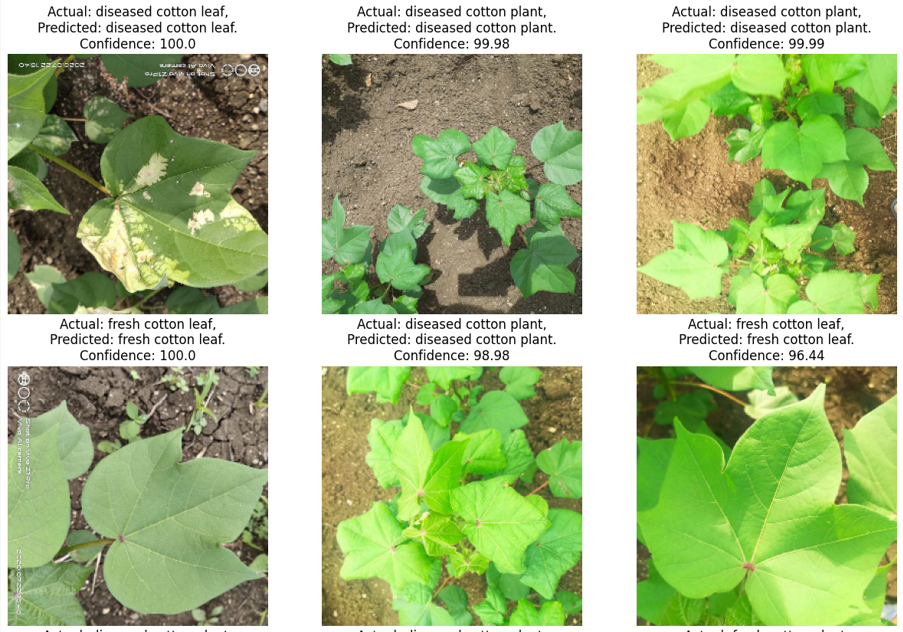

Cotton holds significan economic importance in Bangladesh as a key cash crop, serving as the primary raw material for the textile industry. The annual demand for raw cotton in the country's textile sector is estimated to be approximately 2.5 million bales. However, local production currently meets only a fraction of this demand, standing at around 0.1 million bales. This underscores the substantial reliance on imported cotton to fullfill the needs of Bangladesh's thriving textile industry.

Annually, Bangladesh imports approximately TK 33,000 core worth of cotton from various nations, such as India, Pakistan, Brazil, Australia, Argentina, South African countries and those in Central Asia. According to a Statement from the central Development Bank (CDB), the top official revealed that Bangladesh has realized a cost-saving of $70 million due to the domestic production of 200,000 bales of cotton. This achievement highlights the economic bebefits of local cotton cultivation, contributing to a substantial reduction in import expenses and fostering resilience in the face of international market fluctuations.

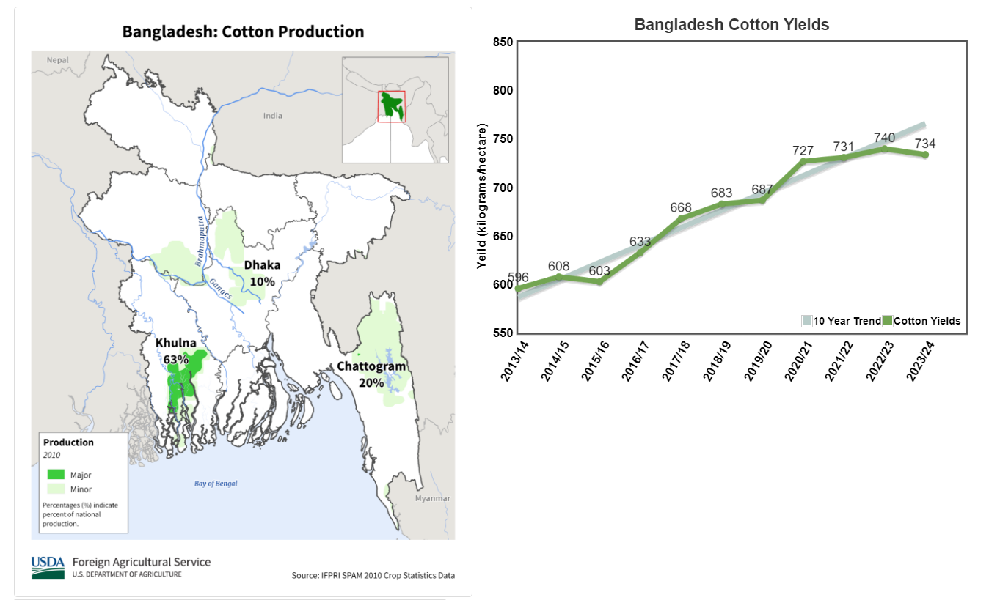

Khulna, Chattogram and Dhaka are the major cotton producing areas. Cotton is mainly sown in the July-August period and harvested in between December and January, it added.

Here, I am attempting to implement a deep learning model for predicting whether an image of a cotton leaf or plant is diseased or not. Upon inputting an image, the model will provide a confidence score and classify whether the image indicates disease presence. This tool is designed to assist farmers in determining the health status of their cotton crops. By leveraging this model, farmers aim to enhance their yields, leading to increased profits and contributions to the overall economy and agrarian sector. The anticipated impact includes a positive influence on the country's Gross Domestic Product (GDP). The implementation of this model is expected to bring economic benefits to farmers and contribute to the growth of the agricultural sector, thereby fostering broader economic development.

===================================================================================================================

In [ ]:
#Import The required Python libraries.
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt

import numpy as np
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

import os
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import metrics
from skimage import io, transform
from sklearn.model_selection import learning_curve

===================================================================================================================

In [ ]:
#here image size is 256x256
IMAGE_SIZE = 256
#every time process 32 images (61x31)~1951
BATCH_SIZE = 61
#how many color have in these pictures
CHANNELS = 3
#80x25~1951
EPOCHS = 80

===================================================================================================================

'tf.keras.preprocessing.image_dataset_from_directory': This function is
part of the TensorFlow Keras API and is used to create a dataset from a
directory of images.

'shuffle=True': This parameter indicates that the dataset should be
shuffled. Shuffling the dataset is important during training to ensure
that the model doesn't learn patterns based on the order of the images.

'image_size=(IMAGE_SIZE, IMAGE_SIZE)': This parameter specifies the
target size for the images. Images in the dataset will be resized to
the specified dimensions. IMAGE_SIZE is a variable that should be
defined earlier in the code.

'batch_size=BATCH_SIZE': This parameter defines the number of samples
per batch. It is a hyperparameter that determines how many samples are
used in each iteration of training.

In [ ]:
# Load the dataset
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/drive/MyDrive/train-20231108T193703Z-001/train",
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 1951 files belonging to 4 classes.


I have categorized my dataset into four classes, with each class associated with its respective folder. Within these folders, there are a total of 1951 image files, signifying distinct representations of each class.

===================================================================================================================

In [ ]:
class_names = dataset.class_names
class_names

['diseased cotton leaf',
 'diseased cotton plant',
 'fresh cotton leaf',
 'fresh cotton plant']

The dataset comprises four classes, namely 'diseased cotton leaf,' 'diseased cotton plant,' 'fresh cotton leaf,' and 'fresh cotton plant.' Each class is specifically represented by its own set of images within the dataset.

===================================================================================================================

In [ ]:
# Print the dataset information
print(f"In the dataset, there are {len(dataset)} files belonging to {len(class_names)} classes.")

In the dataset, there are 32 files belonging to 4 classes.


===================================================================================================================

In [ ]:
for image_batch,label_batch in dataset.take(1):
  #processing everytime is 61, 256x256 height and weight and every
  #pictures have 3 colors which is rgb
  print(image_batch.shape)

(61, 256, 256, 3)


===================================================================================================================

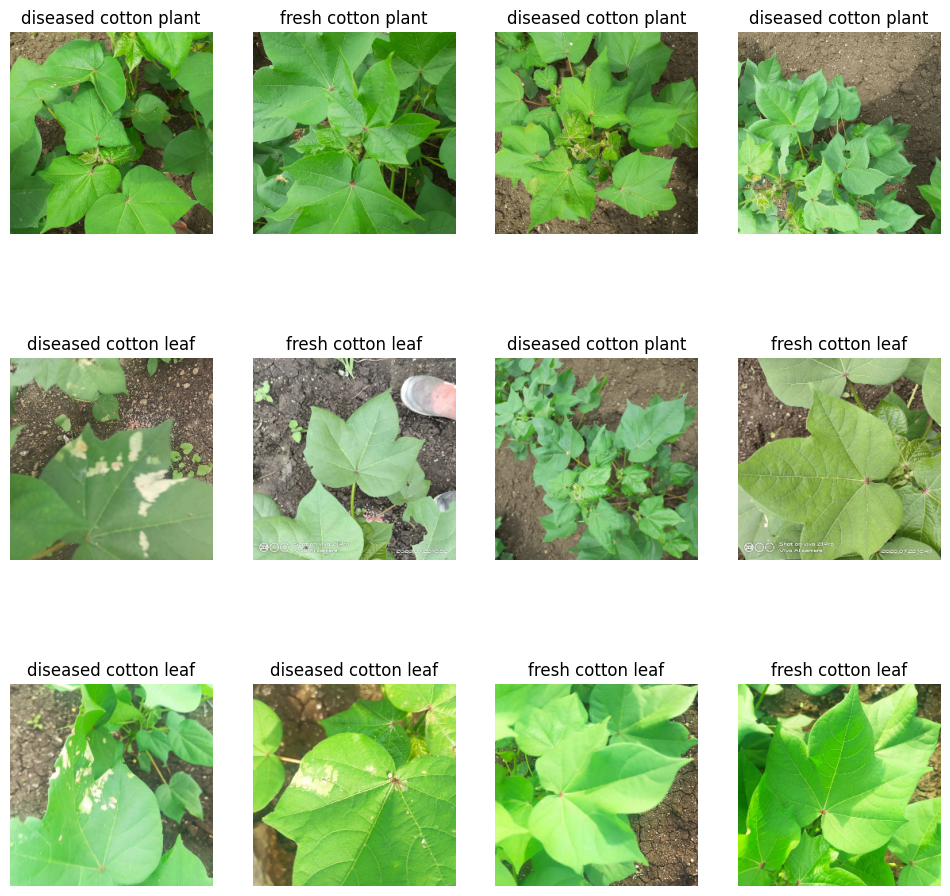

In [ ]:
# Display sample images and labels
plt.figure(figsize=(12,12))
for image_batch, label_batch in dataset.take(1):
    for i in range(12):
        plt.subplot(3, 4, i+1)
        plt.imshow(image_batch[i].numpy().astype('uint8'))
        plt.title(class_names[label_batch[i]])
        plt.axis('off')

===================================================================================================================

In [ ]:
# Split the dataset into train=80%, validation=10%, and test=10% sets
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    #calculate the dataset size
    ds_size = len(ds)
    if shuffle:
'''shuffle_size parameter determines the number of elements from the dataset
from which the shuffling is performed. A larger value of shuffle_size means
a more thorough shuffling, but it also requires more memory. The seed
parameter is optional and is used to seed the random number generator,
ensuring reproducibility. If a person uses the same seed, he/she should get
the same shuffling order each time his/her run the code.'''
        ds = ds.shuffle(shuffle_size, seed=12)
'''train_size: Calculates the size of the training set based on the specified training split ratio.'''
    train_size = int(train_split * ds_size)
'''val_size: Calculates the size of the validation set based on the specified
validation split ratio.'''
    val_size = int(val_split * ds_size)
'''train_ds: Creates the training set by taking the first train_size elements
from the shuffled or original dataset.'''
    train_ds = ds.take(train_size)
'''val_ds: Creates the validation set by skipping the training set elements
and taking the next val_size elements.'''
    val_ds = ds.skip(train_size).take(val_size)
'''test_ds:Creates the test set by skipping both the training and validation
set elements.'''
    test_ds = ds.skip(train_size).skip(val_size)
    return train_ds, val_ds, test_ds

===================================================================================================================

In [ ]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

===================================================================================================================

32x0.8=25.6~25

In [ ]:
len(train_ds)

25

===================================================================================================================

32x.1=3.2~3

In [ ]:
len(val_ds)

3

===================================================================================================================

32-25-3=4

In [ ]:
len(test_ds)

4

===================================================================================================================

.cache(): This function caches the elements of the dataset in memory or on disk. Caching is useful to speed up data loading, especially if the dataset fits into memory.

.shuffle(1000): This shuffles the elements of the dataset. The parameter 1000 specifies the size of the buffer from which elements are randomly chosen for shuffling. A larger buffer size allows for more thorough shuffling.

.prefetch(buffer_size=tf.data.AUTOTUNE): This function prefetches elements from the dataset to improve data loading performance. The buffer_size parameter determines the number of elements to prefetch. Setting it to tf.data.AUTOTUNE allows TensorFlow to dynamically adjust the prefetch buffer size based on available system resources.

In [ ]:
# Prepare the data for training
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

===================================================================================================================

In [ ]:
# Define the model architecture
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = len(class_names)

===================================================================================================================

In [ ]:
n_classes

4

===================================================================================================================

#Convolution Neural Network (CNN)

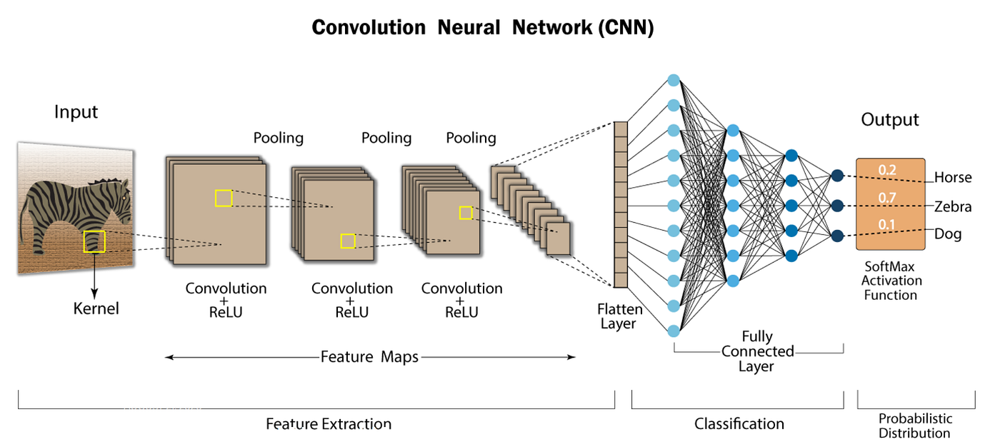

A Convolutional Neural Network (CNN) typically consists of multiple layers that work together to learn hierarchical representations of input data, particularly well-suited for image classification tasks. Here's a simplified explanation of a common CNN architecture:

1. **Input Layer:**
   - The input layer takes in the raw input data, which, in the case of images, is a matrix of pixel values.

2. **Convolutional Layers:**
   - Convolutional layers apply filters (also known as kernels) to the input data, scanning through the image to detect patterns and features. These filters learn to recognize low-level features like edges and textures.

3. **Activation Function:**
   - After each convolutional operation, an activation function (commonly ReLU - Rectified Linear Unit) is applied element-wise to introduce non-linearity and enable the model to learn more complex patterns.

4. **Pooling Layers:**
   - Pooling layers (such as MaxPooling or AveragePooling) follow convolutional layers to reduce the spatial dimensions of the data, preserving the most important information. Pooling helps in reducing computation and makes the learned features more invariant to scale and orientation changes.

5. **Flattening:**
   - After several convolutional and pooling layers, the data is flattened into a vector. This reshaping prepares the data for the fully connected layers.

6. **Fully Connected Layers:**
   - Dense (fully connected) layers are responsible for learning high-level features and making predictions. These layers take the flattened vector as input and gradually reduce it to the final output size (number of classes in classification tasks).

7. **Output Layer:**
   - The output layer produces the final predictions. In a classification task, it often uses a softmax activation function to generate probabilities for each class.

8. **Loss Function:**
   - A loss function measures the difference between the predicted output and the actual target labels. The model learns by minimizing this loss during training.

9. **Optimization Algorithm:**
   - An optimization algorithm (e.g., Stochastic Gradient Descent) adjusts the weights of the neural network based on the calculated loss, gradually improving the model's performance.



===================================================================================================================

In [ ]:
model = models.Sequential([
#Resizes input images to the specified dimensions (`IMAGE_SIZE` x `IMAGE_SIZE`).
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
# Normalizes pixel values of input images to the range [0,1].
    layers.experimental.preprocessing.Rescaling(1.0/255),
#Randomly flips input images horizontally and vertically during training for data augmentation.
    layers.experimental.preprocessing.RandomFlip('horizontal_and_vertical'),
# Randomly applies a rotation to input images during training, with a maximum rotation angle of 0.2 radians.
    layers.experimental.preprocessing.RandomRotation(0.2),
#Convolutional layer with 32 filters, each of size 3x3, using ReLU activation. This is the first layer, and `input_shape` defines the shape of input images.
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
#Max pooling layer with a 2x2 pool size, which reduces the spatial dimensions of the feature maps.
    layers.MaxPooling2D((2, 2)),
# Subsequent blocks of convolutional (`Conv2D`).
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
#max pooling (`MaxPooling2D`) layers follow a similar pattern, gradually reducing spatial dimensions while increasing the number of filters.
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
#Flattens the 3D output to 1D, preparing it for the fully connected layers.
    layers.Flatten(),
#Fully connected layer with 64 neurons and ReLU activation.
    layers.Dense(64, activation='relu'),
##Output layer with `n_classes` neurons (number of classes in your classification task) and softmax activation for multi-class classification.
    layers.Dense(n_classes, activation='softmax'),
])

===================================================================================================================

In [ ]:
model.build(input_shape=input_shape)
model.compile(
#'adam': This specifies the optimization algorithm to be used during training.
    optimizer='adam',
#This parameter defines the loss function.
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
#metrics: This parameter is a list of metrics used to evaluate the performance of the model.
    metrics=['accuracy']
)

===================================================================================================================

In [ ]:

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_1 (Resizing)       (61, 256, 256, 3)         0         
                                                                 
 rescaling_1 (Rescaling)     (61, 256, 256, 3)         0         
                                                                 
 random_flip_1 (RandomFlip)  (61, 256, 256, 3)         0         
                                                                 
 random_rotation_1 (RandomR  (61, 256, 256, 3)         0         
 otation)                                                        
                                                                 
 conv2d_6 (Conv2D)           (61, 254, 254, 32)        896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (61, 127, 127, 32)        0         
 g2D)                                                 

The `model.summary()` method in TensorFlow/Keras is used to display a concise summary of the neural network model. It provides information about the architecture of the model, including details about the layers, output shapes, and the number of parameters.

Here's a breakdown of what each part of the summary typically includes:

1. **Layer (type):** This column shows the type of layer in the neural network, such as Dense, Conv2D, etc.

2. **Output Shape:** Displays the shape of the output produced by each layer. The output shape is specified as `(batch_size, height, width, channels)` for Convolutional layers and `(batch_size, features)` for Dense layers.

3. **Param #:** Represents the number of parameters in each layer. These parameters are the weights and biases that the model learns during training. For example, in a Dense layer, the number of parameters is determined by the size of the input and output dimensions.

4. **Connected to:** Indicates the connections between layers. It shows which layers are connected to the output of a particular layer.

The summary is useful for quickly understanding the overall structure of your model, checking for issues like excessive parameter counts, and ensuring that the model is constructed as expected.

Here's an example of what a typical model summary might look like:

```plaintext
Model: "my_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
=================================================================
dense_1 (Dense)              (None, 64)                320       
_________________________________________________________________
dense_2 (Dense)              (None, 10)                650       
=================================================================
Total params: 970
Trainable params: 970
Non-trainable params: 0
```

In this example, the model consists of two Dense layers, and the summary provides details about the output shape and the number of parameters in each layer. The total trainable parameters are the ones that the model will learn during training.

===================================================================================================================

In [ ]:
# Train the model
history = model.fit(
    train_ds,             #Traning dataset
    epochs=EPOCHS,        #Number of training epochs
    batch_size=BATCH_SIZE,#Size of the mini-batches used during training
    verbose=1,            #Verbosity mode. 0=silent, 1=progress bar, 2=one line per epoch
    validation_data=val_ds#Vlidation dataset
)

Epoch 1/80
25/25 [==============================] - 343s 9s/step - loss: 1.2764 - accuracy: 0.4400 - val_loss: 1.1780 - val_accuracy: 0.5246
Epoch 2/80
25/25 [==============================] - 196s 8s/step - loss: 1.0945 - accuracy: 0.5311 - val_loss: 1.0978 - val_accuracy: 0.5191
Epoch 3/80
25/25 [==============================] - 194s 8s/step - loss: 1.0315 - accuracy: 0.5436 - val_loss: 1.0025 - val_accuracy: 0.6066
Epoch 4/80
25/25 [==============================] - 190s 8s/step - loss: 0.9587 - accuracy: 0.6052 - val_loss: 0.8692 - val_accuracy: 0.6831
Epoch 5/80
25/25 [==============================] - 193s 8s/step - loss: 0.8732 - accuracy: 0.6380 - val_loss: 0.8225 - val_accuracy: 0.6721
Epoch 6/80
25/25 [==============================] - 192s 8s/step - loss: 0.7336 - accuracy: 0.7108 - val_loss: 0.6719 - val_accuracy: 0.7486
Epoch 7/80
25/25 [==============================] - 196s 8s/step - loss: 0.6920 - accuracy: 0.7226 - val_loss: 0.6487 - val_accuracy: 0.7650
Epoch 8/80
25

===================================================================================================================

In [ ]:
# Evaluate the model
scores = model.evaluate(test_ds)
print("Test Loss: ", scores[0])
print("Test Accuracy: ", scores[1])

4/4 [==============================] - 16s 2s/step - loss: 0.2409 - accuracy: 0.9098
Test Loss:  0.24090507626533508
Test Accuracy:  0.9098360538482666


===================================================================================================================

In [ ]:
#here is these what are calculated by
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

===================================================================================================================

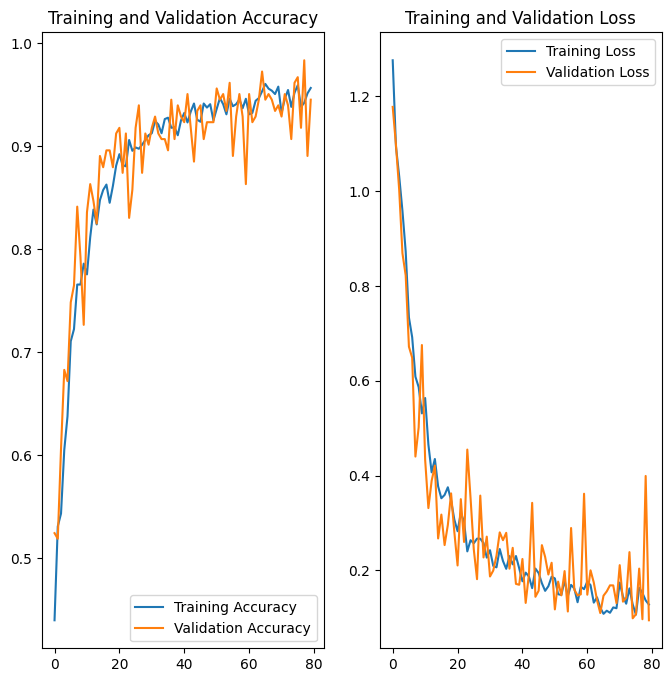

In [ ]:
# Plot the training and validation metrics
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), history.history['accuracy'], label='Training Accuracy')
plt.plot(range(EPOCHS), history.history['val_accuracy'], label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), history.history['loss'], label='Training Loss')
plt.plot(range(EPOCHS), history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.show()

Two learning curves are presented: one depicting "Training and Validation Accuracy," and the other illustrating "Training and Validation Loss." While these curves may not exhibit a perfect fit, there is a noteworthy proximity to an ideal alignment. Despite not achieving absolute perfection, the model's classification performance is highly satisfactory, delivering impressive results.

===================================================================================================================

In [ ]:
def predict(model, img):
    # Convert the image to a NumPy array
    img_array = tf.keras.preprocessing.image.img_to_array(img)

    # Add an extra dimension to the array to match the model's expected input shape
    img_array = tf.expand_dims(img_array, 0)

    # Use the model to make predictions on the image
    predictions = model.predict(img_array)

    # Find the index of the class with the highest probability
    predicted_class = class_names[np.argmax(predictions[0])]

    # Get the confidence level of the prediction (probability of the predicted class)
    confidence = round(100 * np.max(predictions[0]), 2)

    # Return the predicted class and confidence level
    return predicted_class, confidence


===================================================================================================================

First image to predict
Actual label: diseased cotton plant
2/2 [==============================] - 2s 808ms/step
predicted Label:  diseased cotton plant


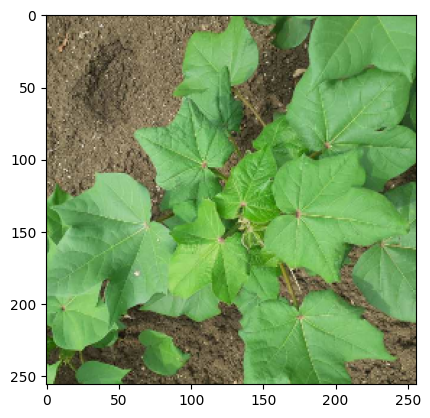

In [ ]:

for images_batch, labels_batch in test_ds.take(1):
  first_image=images_batch[0].numpy().astype('uint8')
  first_label=labels_batch[0].numpy()

  print('First image to predict')
  plt.imshow(first_image)
  print('Actual label:',class_names[first_label])

  batch_prediction=model.predict(images_batch)
  print('predicted Label: ',class_names[np.argmax(batch_prediction[0])])

===================================================================================================================

In [ ]:

plt.figure(figsize=(15,15))
for images_batch, labels_batch in test_ds.take(1):
    for i in range(9):
        plt.subplot(3, 3, i+1)
        plt.imshow(images_batch[i].numpy().astype('uint8'))

        predicted_class, confidence = predict(model, images_batch[i].numpy())
        actual_class = class_names[labels_batch[i]]

        plt.title(f'Actual: {actual_class},\nPredicted: {predicted_class}.\nConfidence: {confidence}')

        plt.axis('off')

Output hidden; open in https://colab.research.google.com to view.

===================================================================================================================

#For Cotton Plant and Leaf
#User Input1:

Enter the path to the image file: /content/drive/MyDrive/val-20231108T193705Z-001/val/diseased cotton leaf/dis_leaf (100)_iaip.jpg
1/1 [==============================] - 0s 212ms/step


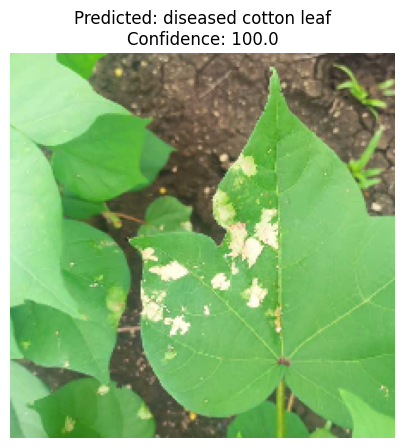

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()


actual_class: Dieased Cotton Leaf

predicted_class: Dieased Cotton Leaf

Confidence: 100

===================================================================================================================

#User Input2:

Enter the path to the image file: /content/drive/MyDrive/val-20231108T193705Z-001/val/fresh cotton leaf/d (106)_iaip.jpg
1/1 [==============================] - 0s 43ms/step


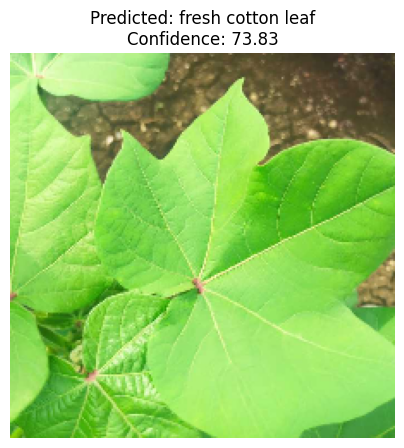

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Fresh Cotton Leaf

predicted_class: Fresh Cotton Leaf

Confidence: 73.83

===================================================================================================================

#User Input3:

Enter the path to the image file: /content/drive/MyDrive/val-20231108T193705Z-001/val/diseased cotton plant/dd (10)_iaip.jpg
1/1 [==============================] - 0s 79ms/step


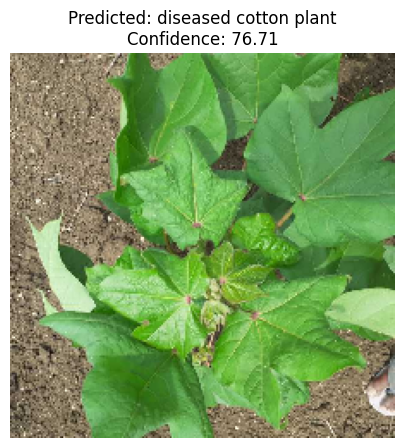

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Dieased Cotton Plant

predicted_class: Dieased Cotton Plant

Confidence: 76.71

===================================================================================================================

#User Input4:

Enter the path to the image file: /content/drive/MyDrive/val-20231108T193705Z-001/val/fresh cotton plant/dsd (140)_iaip.jpg
1/1 [==============================] - 0s 45ms/step


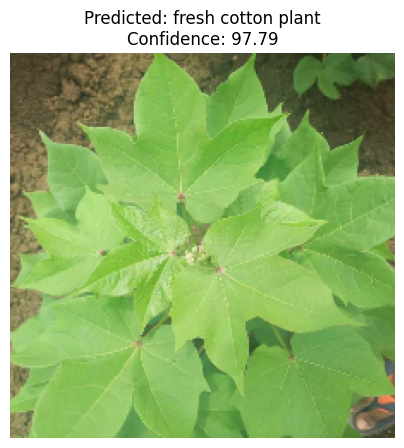

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Fresh Cotton Plant

predicted_class: Fresh Cotton Plant

Confidence: 97.79

===================================================================================================================

#User Input5:

Enter the path to the image file: /content/drive/MyDrive/train-20231108T193703Z-001/train/diseased cotton leaf/dis_leaf (99)_iaip.jpg
1/1 [==============================] - 0s 46ms/step


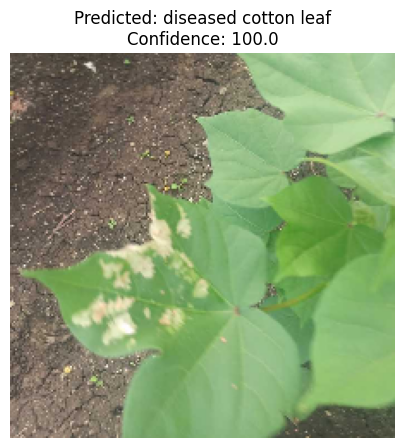

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Dieased Cotton Leaf

predicted_class: Dieased Cotton Leaf

Confidence: 100

===================================================================================================================

#User Input6:

Enter the path to the image file: /content/drive/MyDrive/train-20231108T193703Z-001/train/diseased cotton plant/dd (105)_iaip.jpg
1/1 [==============================] - 0s 44ms/step


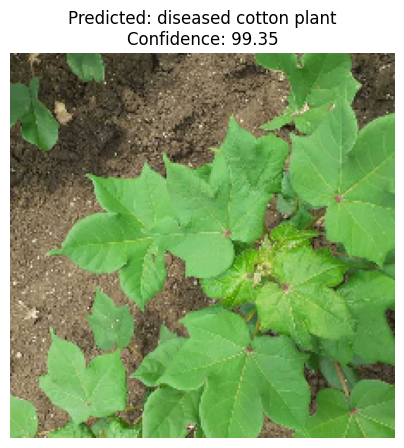

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Dieased Cotton Plant

predicted_class: Dieased Cotton Plant

Confidence: 99.35

===================================================================================================================

#User Input7:

Enter the path to the image file: /content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton leaf/d (110)_iaip.jpg
1/1 [==============================] - 0s 44ms/step


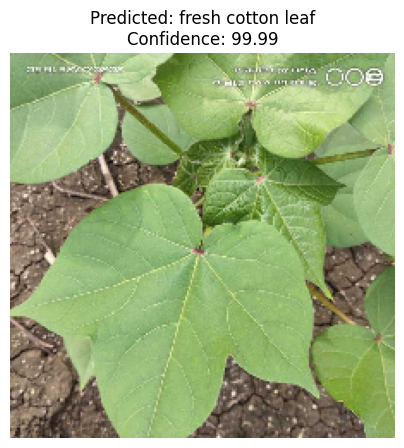

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Fresh Cotton Leaf

predicted_class: Fresh Cotton Leaf

Confidence: 99.99

===================================================================================================================

#User Input8:

Enter the path to the image file: /content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (298)_iaip.jpg
1/1 [==============================] - 0s 75ms/step


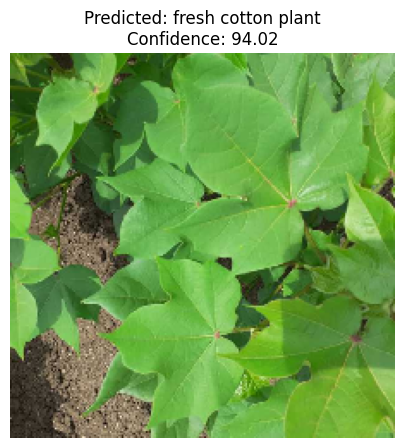

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Fresh Cotton Plant

predicted_class: Fresh Cotton Plant

Confidence: 94.02

===================================================================================================================

#For another plant and leaf and fruit (although these are not trained in the model but I want to know if my model can answer this hyphotically or not). If the model's answer is Dieased and  actual images is Dieased it's ok. My model is working properly.  

#User Input9:

Enter the path to the image file: /content/drive/MyDrive/Potato_Dataset/Potato___Early_blight/00d8f10f-5038-4e0f-bb58-0b885ddc0cc5___RS_Early.B 8722.JPG
1/1 [==============================] - 0s 79ms/step


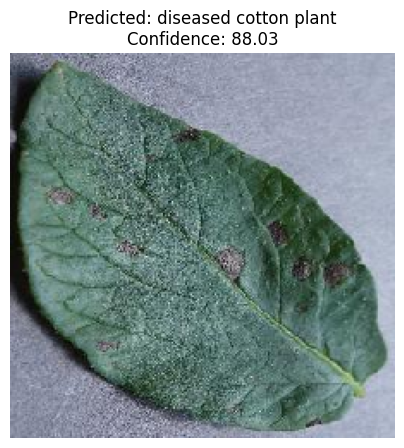

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Dieased Plant

predicted_class: Dieased Plant

Confidence: 88.03

===================================================================================================================

#User Input10:

Enter the path to the image file: /content/drive/MyDrive/Potato_Dataset/Potato___Late_blight/01ad74ce-eb28-42c7-9204-778d17cfd45c___RS_LB 2669.JPG
1/1 [==============================] - 0s 44ms/step


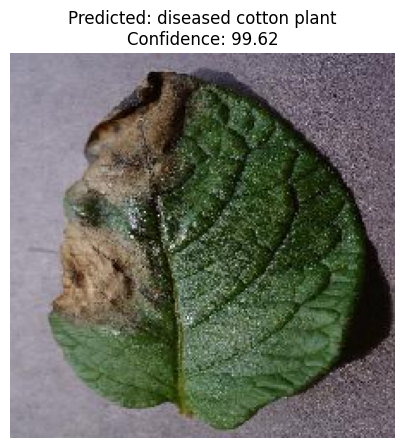

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Dieased Plant

predicted_class: Dieased Plant

Confidence: 99.62

===================================================================================================================

#User Input11:

Enter the path to the image file: /content/drive/MyDrive/Potato_Dataset/Potato___healthy/111cd9d8-4d27-4225-be9e-d29b21cf56b9___RS_HL 5419.JPG
1/1 [==============================] - 0s 44ms/step


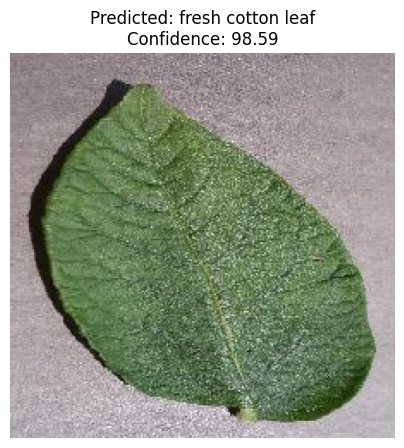

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Fresh Plant

predicted_class: Fresh Plant

Confidence: 99.59

===================================================================================================================

#User Input12:

Enter the path to the image file: /content/drive/MyDrive/Potato_Dataset/Potato___healthy/00fc2ee5-729f-4757-8aeb-65c3355874f2___RS_HL 1864.JPG
1/1 [==============================] - 0s 63ms/step


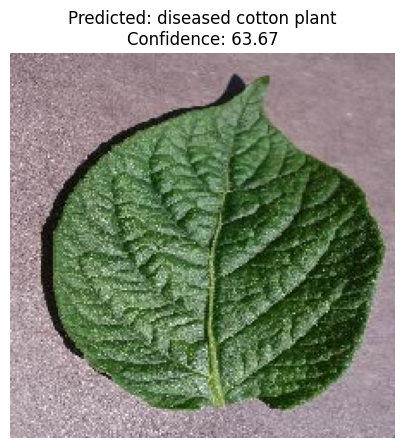

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Fresh Plant

predicted_class: Dieased Plant

Confidence: 67.67

===================================================================================================================

#User Input13:

Enter the path to the image file: /content/drive/MyDrive/Cracking the Cucumber Code: Predicting Disease with the Powerful CNN Model/Original Image/Belly Rot/Belly Rot (10).jpg
1/1 [==============================] - 0s 44ms/step


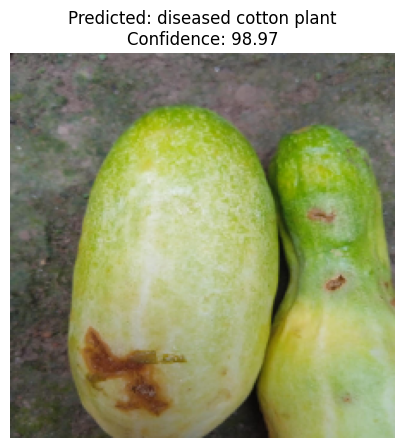

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Dieased Plant

predicted_class: Dieased Plant

Confidence: 98.97

===================================================================================================================

#User Input14:

Enter the path to the image file: /content/drive/MyDrive/Cracking the Cucumber Code: Predicting Disease with the Powerful CNN Model/Original Image/Bacterial Wilt/Bacterial Wilt (101).jpg
1/1 [==============================] - 0s 46ms/step


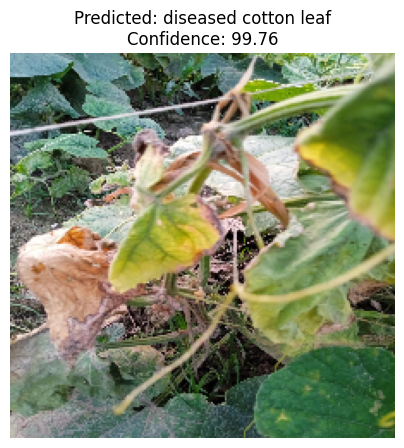

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Dieased Plant

predicted_class: Dieased Plant

Confidence: 99.76

===================================================================================================================

#User Input15:

Enter the path to the image file: /content/drive/MyDrive/Cracking the Cucumber Code: Predicting Disease with the Powerful CNN Model/Original Image/Downy Mildew/Downy Mildew (100).jpg
1/1 [==============================] - 0s 45ms/step


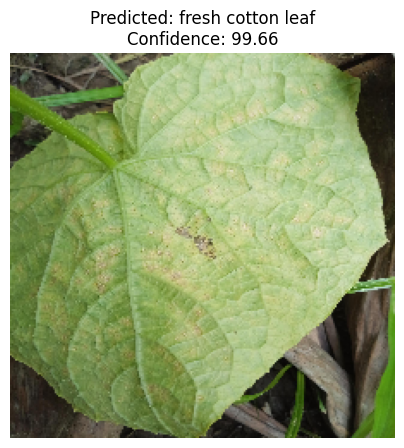

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Dieased Plant

predicted_class: Fresh Plant

Confidence: 99.66

===================================================================================================================

#User Input16:

Enter the path to the image file: /content/drive/MyDrive/Cracking the Cucumber Code: Predicting Disease with the Powerful CNN Model/Original Image/Fresh Cucumber/Fresh Cucumber (100).jpg
1/1 [==============================] - 0s 46ms/step


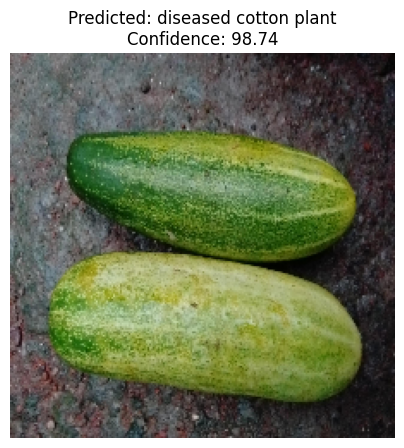

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Fresh Plant

predicted_class: Dieased Plant

Confidence: 98.74

===================================================================================================================

#User Input17:

Enter the path to the image file: /content/drive/MyDrive/Cracking the Cucumber Code: Predicting Disease with the Powerful CNN Model/Original Image/Fresh Leaf/Fresh Leaf (131).jpg
1/1 [==============================] - 0s 49ms/step


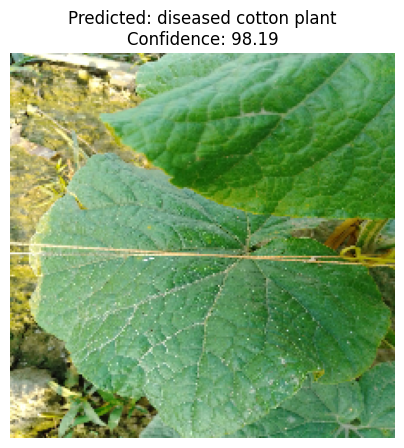

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Fresh Plant

predicted_class: Dieased Plant

Confidence: 98.19

===================================================================================================================

#User Input18:

Enter the path to the image file: /content/drive/MyDrive/Cracking the Cucumber Code: Predicting Disease with the Powerful CNN Model/Original Image/Fresh Leaf/Fresh Leaf (99).jpg
1/1 [==============================] - 0s 46ms/step


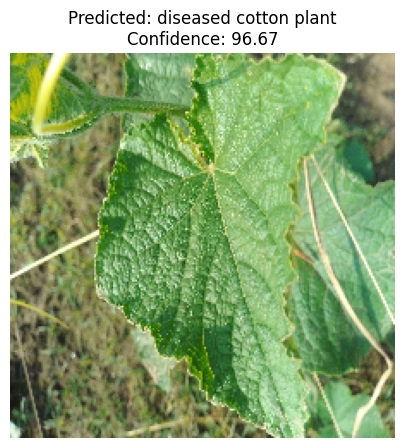

In [ ]:
# Function to preprocess the image before feeding it to the model
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array

# Get the path to the image from the user
image_path = input("Enter the path to the image file: ")

# Load the image and preprocess it
user_image = preprocess_image(image_path)

# Predict the class and confidence
predicted_class, confidence = predict(model, user_image[0])

# Display the image along with predicted class and confidence
plt.figure(figsize=(5, 5))
plt.imshow(image.load_img(image_path, target_size=(224, 224)))
plt.title(f'Predicted: {predicted_class}\nConfidence: {confidence}')
plt.axis('off')
plt.show()

actual_class: Fresh Plant

predicted_class: Dieased Plant

Confidence: 96.67

===================================================================================================================

#SVM


===================================================================================================================

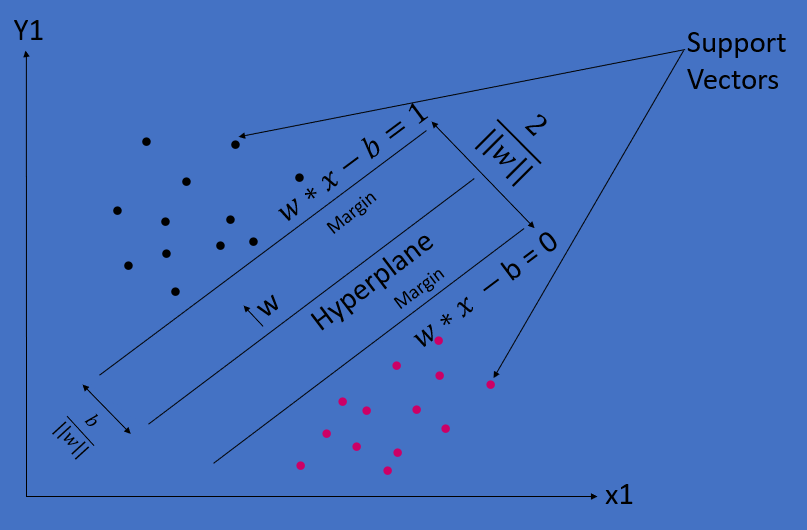

Support Vector Machines (SVMs) represent a supervised machine learning algorithm applicable to both classification and regression tasks. This discussion will specifically explore the utilization of SVMs for image classification.

When a computer processes an image, it interprets it as a two-dimensional array of pixels. The array's size corresponds to the image's resolution, e.g., a 200 pixels by 200 pixels image translates to an array of dimensions 200 x 200 x 3. The first two dimensions denote the width and height, while the third dimension signifies the RGB color channels. Array values range from 0 to 255, reflecting pixel intensity.

To classify an image using SVM, the initial step involves extracting features from the image. These features might include pixel color values, edge detection results, or textures within the image. Once features are extracted, they serve as input for the SVM algorithm.

SVM operates by identifying a hyperplane that segregates different classes within the feature space. The fundamental concept is to locate the hyperplane that maximizes the margin, defined as the distance between the closest points of distinct classes. The points closest to the hyperplane are termed support vectors.

SVMs offer a notable advantage in image classification due to their efficacy in handling high-dimensional data, such as images. Moreover, SVMs exhibit a lower susceptibility to overfitting compared to other algorithms like neural networks.

In the realm of machine learning, where models are trained based on input and expected output data, SVMs stand out as a robust and effective choice, particularly in the context of image classification.

[https://www.geeksforgeeks.org/image-classification-using-support-vector-machine-svm-in-python/](https://)

===================================================================================================================

In [ ]:
# Set the path to your images folder
image_folder = '/content/drive/MyDrive/train-20231108T193703Z-001/train'

===================================================================================================================

In [ ]:
# Get the list of image filenames and their corresponding labels
image_files = []
labels = []

===================================================================================================================

This Python code processes a directory structure containing labeled image data. It iterates through each class folder in the main image folder, collects the file paths of images in each class, and associates them with their respective class labels. The file paths and labels are stored in lists (`image_files` and `labels`, respectively) for further use, likely in a machine learning context.

In [ ]:
for class_folder in os.listdir(image_folder):
    class_path = os.path.join(image_folder, class_folder)
    if os.path.isdir(class_path):
        for img_file in os.listdir(class_path):
            image_files.append(os.path.join(class_path, img_file))
            labels.append(class_folder)

===================================================================================================================

In [ ]:
# Resize images to a consistent size
image_size = (128, 128)
images = [transform.resize(io.imread(img), image_size) for img in image_files]

===================================================================================================================

In [ ]:
# Flatten the images to 1D arrays
images_flat = [img.flatten() for img in images]

# Convert labels to numerical values
label_mapping = {label: idx for idx, label in enumerate(set(labels))}
numeric_labels = [label_mapping[label] for label in labels]

===================================================================================================================

In [ ]:
image_files
labels

['fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cotton plant',
 'fresh cot

===================================================================================================================

In [ ]:
image_files

['/content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (155)_iaip.jpg',
 '/content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (154)_iaip.jpg',
 '/content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (256)_iaip(1).jpg',
 '/content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (256)_iaip.jpg',
 '/content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (272)_iaip.jpg',
 '/content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (265)_iaip(1).jpg',
 '/content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (265)_iaip.jpg',
 '/content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (267)_iaip(1).jpg',
 '/content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (267)_iaip.jpg',
 '/content/drive/MyDrive/train-20231108T193703Z-001/train/fresh cotton plant/dsd (216)_iaip.jpg',
 '/content/

===================================================================================================================

Test=20%

Train=80%

In [ ]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images_flat, numeric_labels, test_size=0.2, random_state=42)

===================================================================================================================

In [ ]:
# Create and train the SVM model
svm_model = svm.SVC(kernel='linear', C=1)
svm_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = svm_model.predict(X_test)

# Evaluate the model
accuracy = metrics.accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')


Accuracy: 0.7493606138107417


===================================================================================================================

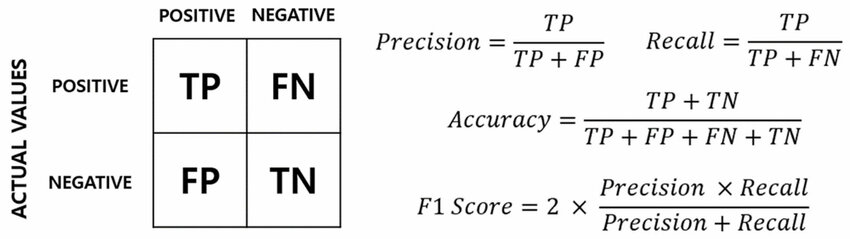

In [ ]:
# Evaluate the model
accuracy = metrics.accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

# Generate and print the classification report
classification_report_str = metrics.classification_report(y_test, y_pred)
print("Classification Report:\n", classification_report_str)

Accuracy: 0.7493606138107417
Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.71      0.71        87
           1       0.67      0.80      0.73        83
           2       0.82      0.83      0.82       163
           3       0.77      0.52      0.62        58

    accuracy                           0.75       391
   macro avg       0.74      0.71      0.72       391
weighted avg       0.75      0.75      0.75       391



Here we see that the precision, recall, f1-score are very close. But accuracy is not much good.

===================================================================================================================

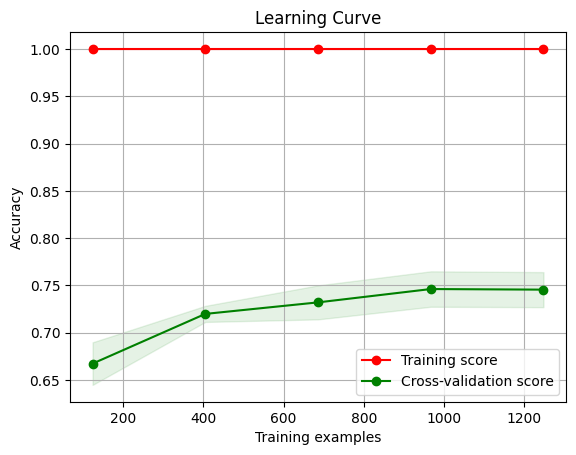

In [ ]:
# Define a function to plot the learning curve
def plot_learning_curve(estimator, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title("Learning Curve")
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")

    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)

    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Plot the learning curve
plot_learning_curve(svm_model, np.array(X_train), np.array(y_train), cv=5, n_jobs=4)
plt.show()


The learning curve indicates that the SVM model doesn't fit well, suggesting it may not be ideal for classification. However, it's crucial to avoid prematurely deeming the model useless. Further investigation, hyperparameter tuning, and potential adjustments to feature engineering or data quality could enhance its performance. It's advisable to explore these avenues before concluding the model's utility.

===================================================================================================================

#Cotton Plant

===================================================================================================================

Captured individual user inputs one by one, extracted three essential data points for each: 'Actual Class,' 'Predicted Class,' and 'Confidence.' Given the small size of the initial dataset (17 inputs), augment the dataset will be expand its breadth. Apply Boxplot analysis to compute the confidence range of the user inputs. If the confidence of an image falls within this established range, the model's classification will be deemed acceptable; otherwise, the classification will be rejected.

===================================================================================================================

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

Here Make a DataFaram

In [ ]:
# Creating a DataFrame with sample data take from the user input(Cotton Plant)
data1 = {'ID': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17],

         'Actual_class': ['Dieased Cotton Leaf', 'Dieased Cotton Plant', 'Dieased Cotton Plant', 'Fresh Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Leaf',
         'Dieased Cotton Plant', 'Dieased Cotton Plant', 'Fresh Cotton Plan', 'Dieased Cotton Leaf', 'Fresh Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Plant',
         'Dieased Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Leaf', 'Fresh Cotton Plant'],

         'Predicted_class': ['Dieased Cotton Leaf', 'Dieased Cotton Plant', 'Dieased Cotton Plant', 'Fresh Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Leaf',
         'Dieased Cotton Plant', 'Dieased Cotton Plant', 'Fresh Cotton Plan', 'Dieased Cotton Leaf', 'Fresh Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Plant',
         'Dieased Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Leaf', 'Fresh Cotton Plant'],

         'Confidence': [100, 99.98, 99.99, 100, 99.98, 96.44, 99.98, 99.97, 99.9, 100, 73.83, 76.71, 97.79, 100, 99.35, 99.99, 94.02],
    }

df1 = pd.DataFrame(data1)
print(df1)

    ID          Actual_class       Predicted_class  Confidence
0    1   Dieased Cotton Leaf   Dieased Cotton Leaf      100.00
1    2  Dieased Cotton Plant  Dieased Cotton Plant       99.98
2    3  Dieased Cotton Plant  Dieased Cotton Plant       99.99
3    4     Fresh Cotton Leaf     Fresh Cotton Leaf      100.00
4    5  Dieased Cotton Plant  Dieased Cotton Plant       99.98
5    6     Fresh Cotton Leaf     Fresh Cotton Leaf       96.44
6    7  Dieased Cotton Plant  Dieased Cotton Plant       99.98
7    8  Dieased Cotton Plant  Dieased Cotton Plant       99.97
8    9     Fresh Cotton Plan     Fresh Cotton Plan       99.90
9   10   Dieased Cotton Leaf   Dieased Cotton Leaf      100.00
10  11     Fresh Cotton Leaf     Fresh Cotton Leaf       73.83
11  12  Dieased Cotton Plant  Dieased Cotton Plant       76.71
12  13    Fresh Cotton Plant    Fresh Cotton Plant       97.79
13  14   Dieased Cotton Leaf   Dieased Cotton Leaf      100.00
14  15  Dieased Cotton Plant  Dieased Cotton Plant     

===================================================================================================================

To address the limited size of the dataset, to utilized the concatenation operation to augment it. Specifically, duplicated the contents of the DataFrame, df1, effectively multiplying its size by 2. This operation resulted in an additional 15 rows, contributing to the overall expansion of the dataset.

In [ ]:
df2=pd.concat([df1]*2,ignore_index=True)
df2

,ID,Actual_class,Predicted_class,Confidence
0,1,Dieased Cotton Leaf,Dieased Cotton Leaf,100.00
1,2,Dieased Cotton Plant,Dieased Cotton Plant,99.98
2,3,Dieased Cotton Plant,Dieased Cotton Plant,99.99
3,4,Fresh Cotton Leaf,Fresh Cotton Leaf,100.00
4,5,Dieased Cotton Plant,Dieased Cotton Plant,99.98
5,6,Fresh Cotton Leaf,Fresh Cotton Leaf,96.44
6,7,Dieased Cotton Plant,Dieased Cotton Plant,99.98
7,8,Dieased Cotton Plant,Dieased Cotton Plant,99.97
8,9,Fresh Cotton Plan,Fresh Cotton Plan,99.90
9,10,Dieased Cotton Leaf,Dieased Cotton Leaf,100.00


===================================================================================================================

17+17=34 rows

In [ ]:
df3=pd.concat([df1, df2], ignore_index=True)
df3

,ID,Actual_class,Predicted_class,Confidence
0,1,Dieased Cotton Leaf,Dieased Cotton Leaf,100.00
1,2,Dieased Cotton Plant,Dieased Cotton Plant,99.98
2,3,Dieased Cotton Plant,Dieased Cotton Plant,99.99
3,4,Fresh Cotton Leaf,Fresh Cotton Leaf,100.00
4,5,Dieased Cotton Plant,Dieased Cotton Plant,99.98
5,6,Fresh Cotton Leaf,Fresh Cotton Leaf,96.44
6,7,Dieased Cotton Plant,Dieased Cotton Plant,99.98
7,8,Dieased Cotton Plant,Dieased Cotton Plant,99.97
8,9,Fresh Cotton Plan,Fresh Cotton Plan,99.90
9,10,Dieased Cotton Leaf,Dieased Cotton Leaf,100.00


===================================================================================================================

In [ ]:
# Creating a DataFrame with sample data
data3 = {'ID': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17],
         'Actual_class': ['Dieased Cotton Leaf', 'Dieased Cotton Plant', 'Dieased Cotton Plant', 'Fresh Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Leaf',
                           'Dieased Cotton Plant', 'Dieased Cotton Plant', 'Fresh Cotton Plan', 'Dieased Cotton Leaf', 'Fresh Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Plant',
                           'Dieased Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Leaf', 'Fresh Cotton Plant'],
         'Predicted_class': ['Dieased Cotton Leaf', 'Dieased Cotton Plant', 'Dieased Cotton Plant', 'Fresh Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Leaf',
                              'Dieased Cotton Plant', 'Dieased Cotton Plant', 'Fresh Cotton Plan', 'Dieased Cotton Leaf', 'Fresh Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Plant',
                              'Dieased Cotton Leaf', 'Dieased Cotton Plant', 'Fresh Cotton Leaf', 'Fresh Cotton Plant'],
         'Confidence': [99, 99.98, 99.99, 99, 99.98, 96.44, 99.98, 99.97, 99.9, 99, 73.83, 76.71, 97.79, 99, 99.35, 99.99, 94.02],
        }
df4 = pd.DataFrame(data3)

noise_factor = 0.02  #Can adjust this factor based on needs
df4['Confidence'] = df4['Confidence'] + np.random.normal(0, noise_factor, len(df4))

df4

,ID,Actual_class,Predicted_class,Confidence
0,1,Dieased Cotton Leaf,Dieased Cotton Leaf,98.993855
1,2,Dieased Cotton Plant,Dieased Cotton Plant,99.955961
2,3,Dieased Cotton Plant,Dieased Cotton Plant,99.961093
3,4,Fresh Cotton Leaf,Fresh Cotton Leaf,99.002868
4,5,Dieased Cotton Plant,Dieased Cotton Plant,99.970408
5,6,Fresh Cotton Leaf,Fresh Cotton Leaf,96.388693
6,7,Dieased Cotton Plant,Dieased Cotton Plant,99.980910
7,8,Dieased Cotton Plant,Dieased Cotton Plant,99.975307
8,9,Fresh Cotton Plan,Fresh Cotton Plan,99.907771
9,10,Dieased Cotton Leaf,Dieased Cotton Leaf,98.998305


Adding noise_factor = 0.02. Get more 17 rows.

===================================================================================================================

34+34=68

In [ ]:
df_merge=pd.concat([df4, df3], ignore_index=True)
df_merge

,ID,Actual_class,Predicted_class,Confidence
0,1,Dieased Cotton Leaf,Dieased Cotton Leaf,98.993855
1,2,Dieased Cotton Plant,Dieased Cotton Plant,99.955961
2,3,Dieased Cotton Plant,Dieased Cotton Plant,99.961093
3,4,Fresh Cotton Leaf,Fresh Cotton Leaf,99.002868
4,5,Dieased Cotton Plant,Dieased Cotton Plant,99.970408
...,...,...,...,...
63,13,Fresh Cotton Plant,Fresh Cotton Plant,97.790000
64,14,Dieased Cotton Leaf,Dieased Cotton Leaf,100.000000
65,15,Dieased Cotton Plant,Dieased Cotton Plant,99.350000
66,16,Fresh Cotton Leaf,Fresh Cotton Leaf,99.990000


===================================================================================================================

In [ ]:
df_merge.shape

(68, 4)

===================================================================================================================

Remove the 'ID' column. Cause it is not necessary.

In [ ]:
df_merge=df_merge.drop("ID",axis=1)
df_merge

,Actual_class,Predicted_class,Confidence
0,Dieased Cotton Leaf,Dieased Cotton Leaf,98.993855
1,Dieased Cotton Plant,Dieased Cotton Plant,99.955961
2,Dieased Cotton Plant,Dieased Cotton Plant,99.961093
3,Fresh Cotton Leaf,Fresh Cotton Leaf,99.002868
4,Dieased Cotton Plant,Dieased Cotton Plant,99.970408
...,...,...,...
63,Fresh Cotton Plant,Fresh Cotton Plant,97.790000
64,Dieased Cotton Leaf,Dieased Cotton Leaf,100.000000
65,Dieased Cotton Plant,Dieased Cotton Plant,99.350000
66,Fresh Cotton Leaf,Fresh Cotton Leaf,99.990000


===================================================================================================================

To calculate the mean value to understand normalization.

In [ ]:
df_merge['Confidence'].mean()

96.28814060448474

===================================================================================================================

Generate a boxplot to visually detect outliers. Subsequently, remove the identified outliers and create another boxplot, focusing on the

(i) Maximum,

(ii) Minimum,

(iii) First quartile (Q1),

(iv) Median (Q2) and

(iv) Third quartile (Q3)of the dataset.

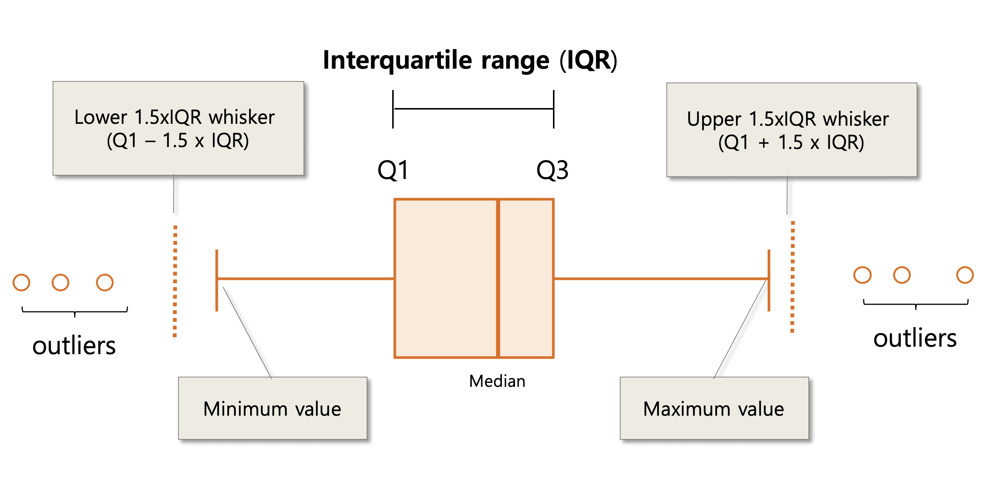

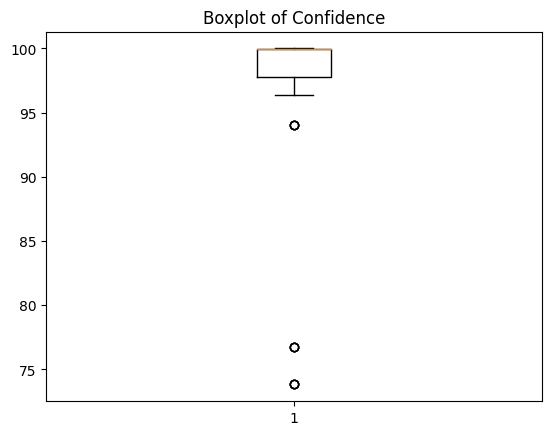

In [ ]:
# Create a boxplot using matplotlib directly
plt.boxplot(df_merge['Confidence'])

# Display the boxplot
plt.title('Boxplot of Confidence')
plt.show()

===================================================================================================================

In [ ]:
# Calculate the first and third quartiles (Q1 and Q3)
Q1 = df_merge['Confidence'].quantile(0.25)
Q3 = df_merge['Confidence'].quantile(0.75)
# Calculate the IQR (Interquartile Range)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

===================================================================================================================

In [ ]:
# Count the number of outliers
outliers_count = ((df_merge['Confidence'] < lower_bound) | (df_merge['Confidence'] > upper_bound)).sum()

print(f'Number of outliers: {outliers_count}')


Number of outliers: 12


===================================================================================================================

In [ ]:
# Calculate the percentage of outliers
percentage_outliers = (outliers_count / len(df_merge['Confidence'])) * 100

print(f'Percentage of outliers: {percentage_outliers:.2f}%')

Percentage of outliers: 17.65%


===================================================================================================================

The Percentage of Outliers: 17.65%.

===================================================================================================================

In [ ]:
# Filter the DataFrame to exclude outliers
df_no_outliers = df_merge[(df_merge['Confidence'] >= lower_bound) & (df_merge['Confidence'] <= upper_bound)]

# Display the DataFrame without outliers
print(df_no_outliers)

            Actual_class       Predicted_class  Confidence
0    Dieased Cotton Leaf   Dieased Cotton Leaf   98.993855
1   Dieased Cotton Plant  Dieased Cotton Plant   99.955961
2   Dieased Cotton Plant  Dieased Cotton Plant   99.961093
3      Fresh Cotton Leaf     Fresh Cotton Leaf   99.002868
4   Dieased Cotton Plant  Dieased Cotton Plant   99.970408
5      Fresh Cotton Leaf     Fresh Cotton Leaf   96.388693
6   Dieased Cotton Plant  Dieased Cotton Plant   99.980910
7   Dieased Cotton Plant  Dieased Cotton Plant   99.975307
8      Fresh Cotton Plan     Fresh Cotton Plan   99.907771
9    Dieased Cotton Leaf   Dieased Cotton Leaf   98.998305
12    Fresh Cotton Plant    Fresh Cotton Plant   97.766633
13   Dieased Cotton Leaf   Dieased Cotton Leaf   98.988170
14  Dieased Cotton Plant  Dieased Cotton Plant   99.359830
15     Fresh Cotton Leaf     Fresh Cotton Leaf   99.992813
17   Dieased Cotton Leaf   Dieased Cotton Leaf  100.000000
18  Dieased Cotton Plant  Dieased Cotton Plant   99.9800

===================================================================================================================

In [ ]:
df_no_outliers.shape

(56, 3)

Following the removal of outliers, the dataset now comprises 56 rows.

===================================================================================================================

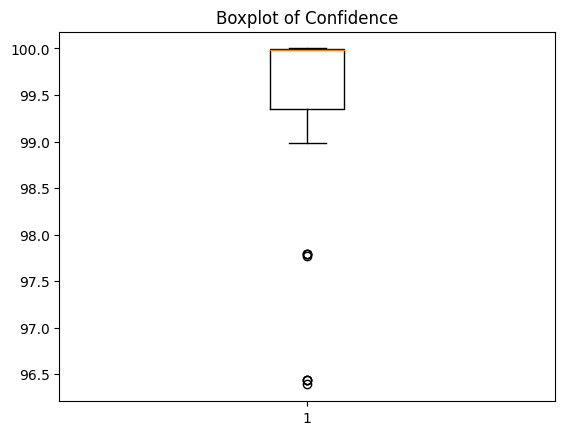

In [ ]:
# Create a boxplot using matplotlib directly
plt.boxplot(df_no_outliers['Confidence'])

# Display the boxplot
plt.title('Boxplot of Confidence')
plt.show()

Now here we see some little bit outliers. These are not necessary to remove.

===================================================================================================================

In [ ]:
df_no_outliers['Confidence'].min()

96.38869264555571

Following the removal of outliers, the min value is 96.3888 which is lower range of the confidence.

===================================================================================================================

In [ ]:
df_no_outliers['Confidence'].max()

100.0

Following the removal of outliers, the max value is 100.0 which is higher range of the confidence.

===================================================================================================================

#The Confidence range is consistently between 96.38% and 100%.

In [ ]:
df_no_outliers.columns

Index(['Actual_class', 'Predicted_class', 'Confidence'], dtype='object')

===================================================================================================================

In [ ]:
# Check if 'Actual_class' and 'Predicted_class' columns are the same
are_same = df_no_outliers['Actual_class'].equals(df_no_outliers['Predicted_class'])

if are_same:
    print("The 'Actual_class' and 'Predicted_class' columns are the same for all rows.")
else:
    print("The 'Actual_class' and 'Predicted_class' columns are not the same for all rows.")


The 'Actual_class' and 'Predicted_class' columns are the same for all rows.


The 'Actual_class' and 'Predicted_class' columns consistently match across all rows, indicating a high accuracy in the model's predictions. The Confidence range is consistently between 96.38% and 100%. Any deviation from this range suggests that the user should consider capturing new images for improved classification accuracy.

===================================================================================================================

#Another Plant(Optional)

Utilizing a distinct plant for assessment, the model demonstrates its classification capabilities beyond Cotton plants and leaves. The newly generated dataset comprises four key columns: 'ID', 'Actual_class', 'Predicted_class', and 'Confidence'. It is important to note that the model was exclusively trained for Cotton plants and leaves, making the classification of other plants, leaves, or fruits a challenging task. This endeavor aims to validate the hypothesis that the model exhibits proficiency in classifying diverse plant types.

===================================================================================================================

In [ ]:
# Creating a DataFrame with sample data take from the user input(Another Plant_Optional)

data5 = {'ID': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
        'Actual_class': ['Dieased', 'Dieased', 'Fresh', 'Fresh','Dieased', 'Dieased', 'Dieased', 'Fresh','Fresh','Fresh'],

        'Predicted_class': ['Dieased', 'Dieased', 'Fresh', 'Fresh', 'Dieased', 'Dieased','Fresh','Dieased', 'Dieased','Dieased'],

        'Confidence': [88.03, 99.62, 99.59, 67.67, 98.97, 99.76, 99.66, 96.67, 98.19, 98.74],
    }
df5 = pd.DataFrame(data5)
# Displaying the DataFrame
print(df5)

   ID Actual_class Predicted_class  Confidence
0   1      Dieased         Dieased       88.03
1   2      Dieased         Dieased       99.62
2   3        Fresh           Fresh       99.59
3   4        Fresh           Fresh       67.67
4   5      Dieased         Dieased       98.97
5   6      Dieased         Dieased       99.76
6   7      Dieased           Fresh       99.66
7   8        Fresh         Dieased       96.67
8   9        Fresh         Dieased       98.19
9  10        Fresh         Dieased       98.74


===================================================================================================================

10*2=20

In [ ]:
df6=pd.concat([df5]*2,ignore_index=True)
df6

,ID,Actual_class,Predicted_class,Confidence
0,1,Dieased,Dieased,88.03
1,2,Dieased,Dieased,99.62
2,3,Fresh,Fresh,99.59
3,4,Fresh,Fresh,67.67
4,5,Dieased,Dieased,98.97
5,6,Dieased,Dieased,99.76
6,7,Dieased,Fresh,99.66
7,8,Fresh,Dieased,96.67
8,9,Fresh,Dieased,98.19
9,10,Fresh,Dieased,98.74


===================================================================================================================

10+20=30

In [ ]:
df7=pd.concat([df5, df6], ignore_index=True)
df7

,ID,Actual_class,Predicted_class,Confidence
0,1,Dieased,Dieased,88.03
1,2,Dieased,Dieased,99.62
2,3,Fresh,Fresh,99.59
3,4,Fresh,Fresh,67.67
4,5,Dieased,Dieased,98.97
5,6,Dieased,Dieased,99.76
6,7,Dieased,Fresh,99.66
7,8,Fresh,Dieased,96.67
8,9,Fresh,Dieased,98.19
9,10,Fresh,Dieased,98.74


===================================================================================================================

After adding noise_factor1 = 0.02,

To get 10 rows.

In [ ]:
# Creating a DataFrame with sample data
data6 = {'ID': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
        'Actual_class': ['Dieased', 'Dieased', 'Fresh', 'Fresh','Dieased', 'Dieased', 'Dieased', 'Fresh','Fresh','Fresh'],

        'Predicted_class': ['Dieased', 'Dieased', 'Fresh', 'Fresh', 'Dieased', 'Dieased','Fresh','Dieased', 'Dieased','Dieased'],

        'Confidence': [88.03, 99.62, 99.59, 67.67, 98.97, 99.76, 99.66, 96.67, 98.19, 98.74],
    }

df8 = pd.DataFrame(data6)

noise_factor1 = 0.02  #Can adjust this factor based on needs
df8['Confidence'] = df8['Confidence'] + np.random.normal(0, noise_factor1, len(df8))

df8

,ID,Actual_class,Predicted_class,Confidence
0,1,Dieased,Dieased,88.032802
1,2,Dieased,Dieased,99.613652
2,3,Fresh,Fresh,99.597955
3,4,Fresh,Fresh,67.673828
4,5,Dieased,Dieased,98.974600
5,6,Dieased,Dieased,99.739617
6,7,Dieased,Fresh,99.664316
7,8,Fresh,Dieased,96.664668
8,9,Fresh,Dieased,98.179237
9,10,Fresh,Dieased,98.758316


===================================================================================================================

30+10=40

In [ ]:
df_merge_another=pd.concat([df7, df8], ignore_index=True)
df_merge_another

,ID,Actual_class,Predicted_class,Confidence
0,1,Dieased,Dieased,88.030000
1,2,Dieased,Dieased,99.620000
2,3,Fresh,Fresh,99.590000
3,4,Fresh,Fresh,67.670000
4,5,Dieased,Dieased,98.970000
5,6,Dieased,Dieased,99.760000
6,7,Dieased,Fresh,99.660000
7,8,Fresh,Dieased,96.670000
8,9,Fresh,Dieased,98.190000
9,10,Fresh,Dieased,98.740000


===================================================================================================================

In [ ]:
df_merge_another.shape

(40, 4)

===================================================================================================================

Remove the 'ID' column. Cause it is not necessary.

In [ ]:
df_merge_another=df_merge_another.drop("ID",axis=1)
df_merge_another

,Actual_class,Predicted_class,Confidence
0,Dieased,Dieased,88.030000
1,Dieased,Dieased,99.620000
2,Fresh,Fresh,99.590000
3,Fresh,Fresh,67.670000
4,Dieased,Dieased,98.970000
5,Dieased,Dieased,99.760000
6,Dieased,Fresh,99.660000
7,Fresh,Dieased,96.670000
8,Fresh,Dieased,98.190000
9,Fresh,Dieased,98.740000


===================================================================================================================

To calculate the mean value to understand normalization.

In [ ]:
df_merge_another['Confidence'].mean()

94.68997476108227

===================================================================================================================

Same as previous.

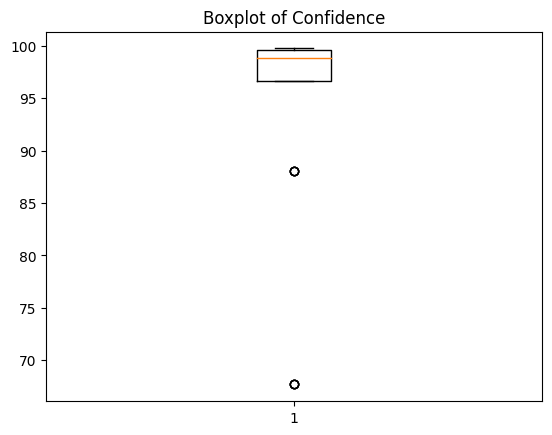

In [ ]:
# Create a boxplot using matplotlib directly
plt.boxplot(df_merge_another['Confidence'])

# Display the boxplot
plt.title('Boxplot of Confidence')
plt.show()

===================================================================================================================

In [ ]:
# Calculate the first and third quartiles (Q1 and Q3)
Q1 = df_merge_another['Confidence'].quantile(0.25)
Q3 = df_merge_another['Confidence'].quantile(0.75)
# Calculate the IQR (Interquartile Range)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

===================================================================================================================

In [ ]:
# Count the number of outliers
outliers_count_another = ((df_merge_another['Confidence'] < lower_bound) | (df_merge_another['Confidence'] > upper_bound)).sum()

print(f'Number of outliers: {outliers_count_another}')

Number of outliers: 8


There is total Number of outliers: 8

===================================================================================================================

In [ ]:
# Calculate the percentage of outliers
percentage_outliers_another = (outliers_count_another / len(df_merge_another['Confidence'])) * 100

print(f'Percentage of outliers: {percentage_outliers_another:.2f}%')

Percentage of outliers: 20.00%


The Percentage of outliers: 20.00% of Another Plants dataset.

===================================================================================================================

In [ ]:
# Filter the DataFrame to exclude outliers
df_no_outliers_another = df_merge_another[(df_merge_another['Confidence'] >= lower_bound) & (df_merge_another['Confidence'] <= upper_bound)]

# Display the DataFrame without outliers
print(df_no_outliers_another)

   Actual_class Predicted_class  Confidence
1       Dieased         Dieased   99.620000
2         Fresh           Fresh   99.590000
4       Dieased         Dieased   98.970000
5       Dieased         Dieased   99.760000
6       Dieased           Fresh   99.660000
7         Fresh         Dieased   96.670000
8         Fresh         Dieased   98.190000
9         Fresh         Dieased   98.740000
11      Dieased         Dieased   99.620000
12        Fresh           Fresh   99.590000
14      Dieased         Dieased   98.970000
15      Dieased         Dieased   99.760000
16      Dieased           Fresh   99.660000
17        Fresh         Dieased   96.670000
18        Fresh         Dieased   98.190000
19        Fresh         Dieased   98.740000
21      Dieased         Dieased   99.620000
22        Fresh           Fresh   99.590000
24      Dieased         Dieased   98.970000
25      Dieased         Dieased   99.760000
26      Dieased           Fresh   99.660000
27        Fresh         Dieased 

===================================================================================================================

In [ ]:
df_no_outliers_another.shape

(32, 3)

Following the removal of outliers, the dataset now comprises 32 rows.

===================================================================================================================

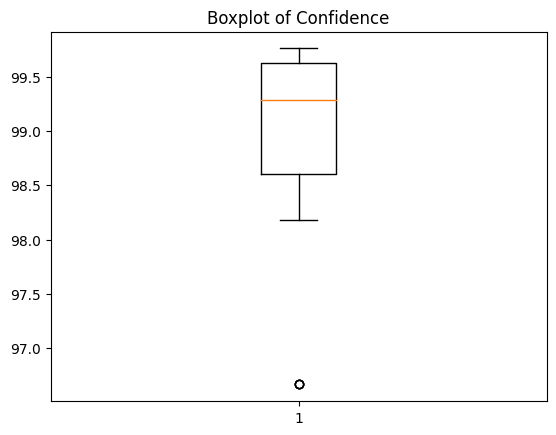

In [ ]:
# Create a boxplot using matplotlib directly
plt.boxplot(df_no_outliers_another['Confidence'])

# Display the boxplot
plt.title('Boxplot of Confidence')
plt.show()

Same as previous.

===================================================================================================================

In [ ]:
df_no_outliers_another['Confidence'].max()

99.76

Following the removal of outliers, the max value is 99.76 which is higher range of the confidence.

===================================================================================================================

In [ ]:
df_no_outliers_another['Confidence'].min()

96.66466833507356

Following the removal of outliers, the min value is 96.66 which is lower range of the confidence.

===================================================================================================================

#The Confidence range is consistently between 96.66% and 99.76%.

In [ ]:
df_no_outliers_another.columns

Index(['Actual_class', 'Predicted_class', 'Confidence'], dtype='object')

===================================================================================================================

In [ ]:
[98]
# Check if 'Actual_class' and 'Predicted_class' columns are the same
are_same_another = df_no_outliers_another['Actual_class'].equals(df_no_outliers_another['Predicted_class'])

if are_same_another:
    print("The 'Actual_class' and 'Predicted_class' columns are the same for all rows.")
else:
    print("The 'Actual_class' and 'Predicted_class' columns are not the same for all rows.")

The 'Actual_class' and 'Predicted_class' columns are not the same for all rows.


The 'Actual_class' and 'Predicted_class' columns  consistently don't match across all rows, indicating a high accuracy in the model's predictions. The Confidence range is consistently between 96.66% and 99.76%. But that term is not valied. So that hypothese is not possible.

===================================================================================================================

#Conclusion

===================================================================================================================

The 'Actual_class' and 'Predicted_class' columns consistently match across all rows, indicating a high accuracy in the model's predictions. The Confidence range is consistently between 96.38% and 100%. Any deviation from this range suggests that the user should consider capturing new images for improved classification accuracy.

===================================================================================================================

#Limitations

===================================================================================================================

The model is incapable of classifying other plants, leaves, and fruits. Additionally, there is room for improvement in the learning curve.

===================================================================================================================